In [1]:
%matplotlib inline
%env CUDA_VISIBLE_DEVICES = 1

env: CUDA_VISIBLE_DEVICES=1


In [2]:
%run mylibrary.ipynb
%run mymodel.ipynb

2025-03-31 20:56:27.125690: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743454587.136685 2613525 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743454587.139912 2613525 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-31 20:56:27.151909: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import math
import random
from ast import literal_eval

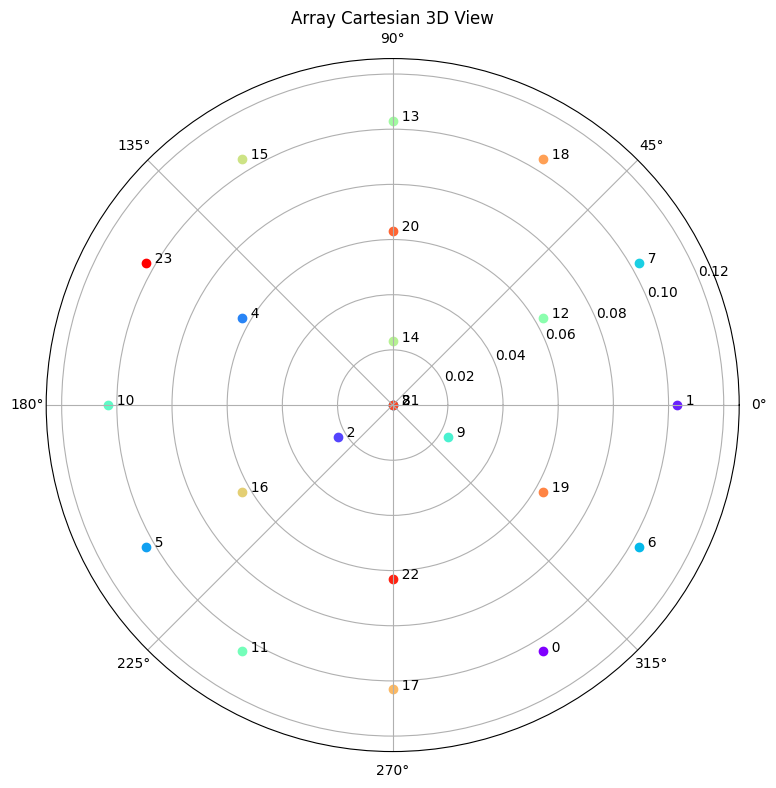

In [4]:
geometry = pd.read_csv('../AA_geometry.tsv', header=None, sep='\t')
AA_Geometry = geometry.to_numpy()
visualizer = Visualizer(AA_Geometry)
visualizer.polar(fig_size=(10,9),save_dir = 'plot/')

['random_signal_source_info_0.dat', 'random_signal_source_info_1.dat', 'random_signal_source_info_2.dat', 'random_signal_source_info_3.dat', 'random_signal_source_info_4.dat', 'random_signal_source_info_5.dat', 'random_signal_source_info_6.dat', 'random_signal_source_info_7.dat', 'random_signal_source_info_8.dat', 'random_signal_source_info_9.dat', 'random_signal_source_info_10.dat', 'random_signal_source_info_11.dat', 'random_signal_source_info_12.dat', 'random_signal_source_info_13.dat', 'random_signal_source_info_14.dat', 'random_signal_source_info_15.dat', 'random_signal_source_info_16.dat', 'random_signal_source_info_17.dat', 'random_signal_source_info_18.dat', 'random_signal_source_info_19.dat']
['random_signal_source_info_0_tau.bin', 'random_signal_source_info_1_tau.bin', 'random_signal_source_info_2_tau.bin', 'random_signal_source_info_3_tau.bin', 'random_signal_source_info_4_tau.bin', 'random_signal_source_info_5_tau.bin', 'random_signal_source_info_6_tau.bin', 'random_signal_

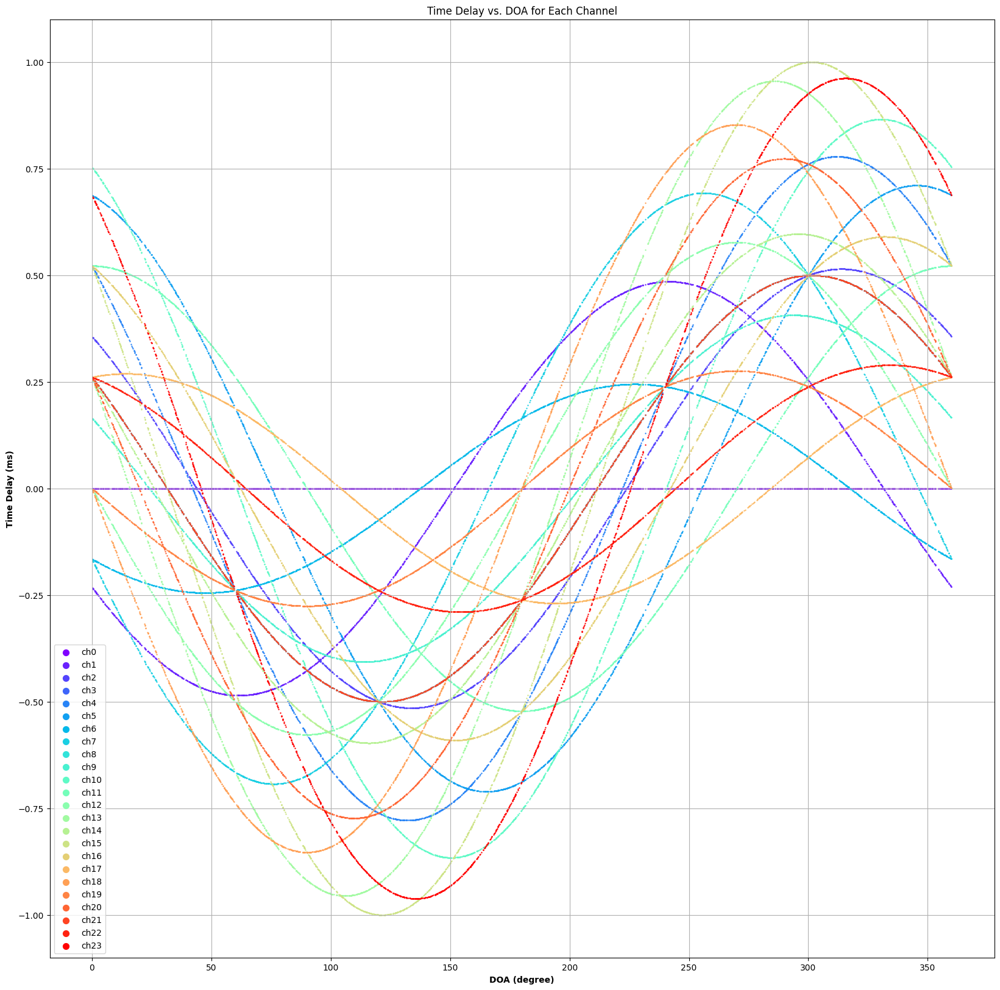

In [5]:
# Extract data from files
data = DataExtract("../data/rss360/", 24)
inputs, labels = data.get_delays_angles()
data.plot()

In [7]:
df_with_he = pd.read_csv("plot/models_evaluation_with_weights_initialization.csv")
list_channels = [re.findall(r'\d+',item['Channels']) for i,item in df_with_he.iterrows()]
list_channels = [sorted([int(i) for i in ls]) for ls in list_channels]
list_channels

[[1, 14, 21],
 [12, 14, 20],
 [10, 11, 13],
 [8, 17, 22],
 [6, 11, 20],
 [7, 8, 21],
 [0, 12, 22],
 [8, 11, 13],
 [2, 10, 22],
 [7, 15, 22],
 [8, 16, 23],
 [1, 4, 14],
 [1, 5, 12],
 [7, 8, 11],
 [3, 11, 17],
 [6, 12, 13],
 [3, 7, 10],
 [4, 13, 23],
 [10, 13, 22],
 [4, 9, 15],
 [4, 16, 17],
 [3, 10, 13],
 [3, 10, 13],
 [8, 10, 15],
 [6, 16, 22],
 [15, 19, 21],
 [1, 13, 19],
 [5, 18, 21],
 [3, 4, 21],
 [7, 9, 11],
 [8, 15, 17],
 [0, 7, 18],
 [1, 14, 21],
 [17, 20, 22],
 [5, 13, 14],
 [4, 14, 22],
 [0, 15, 23],
 [5, 15, 23],
 [3, 7, 10],
 [0, 2, 12],
 [2, 10, 19],
 [3, 9, 20],
 [6, 15, 21],
 [3, 12, 20],
 [10, 12, 13],
 [0, 7, 17],
 [10, 11, 18],
 [13, 14, 16],
 [5, 12, 22],
 [15, 19, 23],
 [0, 2, 4, 6, 14, 23],
 [2, 4, 5, 6, 10, 16],
 [1, 5, 6, 15, 16, 22],
 [2, 5, 9, 13, 17, 22],
 [2, 10, 12, 14, 20, 23],
 [5, 6, 7, 13, 19, 23],
 [5, 11, 13, 15, 21, 22],
 [3, 8, 14, 15, 16, 17],
 [10, 14, 16, 17, 20, 21],
 [0, 1, 2, 13, 14, 15],
 [0, 2, 5, 7, 9, 18],
 [2, 3, 9, 10, 11, 15],
 [4, 8, 9, 1

In [11]:
# Get the list of channels with loss less than 55
# The 75 is a convience number from the results
top_with_he =  df_with_he.index[df_with_he['Loss'] < 55].tolist()
top_list_channels = [list_channels[i] for i in top_with_he]
top_list_channels.append(list(range(0,24)))
print(len(top_list_channels))
top_list_channels

15


[[6, 12, 13],
 [1, 13, 19],
 [0, 7, 18],
 [3, 12, 20],
 [12, 13, 15, 17, 19, 22],
 [2, 9, 10, 12, 17, 18],
 [2, 7, 9, 13, 19, 20],
 [8, 12, 16, 18, 21, 22],
 [2, 6, 8, 9, 12, 15, 18, 20, 22],
 [0, 2, 4, 8, 9, 12, 18, 19, 22],
 [1, 2, 3, 4, 9, 13, 17, 18, 22],
 [0, 3, 5, 6, 9, 12, 14, 15, 18, 19, 20, 23],
 [2, 3, 4, 6, 8, 10, 12, 13, 14, 15, 17, 18, 19, 22, 23],
 [0, 1, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23]]

2025-03-31 21:01:52.006420: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-03-31 21:01:57.444955: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-31 21:02:02.985377: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-31 21:02:13.601541: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-31 21:02:35.302085: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
/tmp/ipykernel_2613525/128754474.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) 

[[3.1221768856048584, 444.14703369140625, 4.318536758422852],
 [2.117750406265259, 732.8558349609375, 4.101465702056885],
 [0.4237893521785736, 2.3351035118103027, 0.4237893521785736],
 [1.081210970878601, 448.68402099609375, 2.279383659362793],
 [1.4664838314056396, 465.3368835449219, 2.659449338912964],
 [2.6635303497314453, 866.1273193359375, 5.0400919914245605],
 [0.7305102944374084, 1.4669575691223145, 0.7305102944374084],
 [0.8299625515937805, 184.17091369628906, 1.1957587003707886],
 [0.9870311617851257, 12.570557594299316, 0.9870311617851257],
 [1.3539131879806519, 2.7093098163604736, 1.3539131879806519],
 [1.8170994520187378, 77.14010620117188, 1.8170994520187378],
 [2.2640621662139893, 439.1909484863281, 3.4622607231140137],
 [1.6578694581985474, 440.5080261230469, 2.854325294494629],
 [1.2038601636886597, 30.078073501586914, 1.2038601636886597],
 [1.3090065717697144, 61.04967498779297, 1.3090065717697144]]

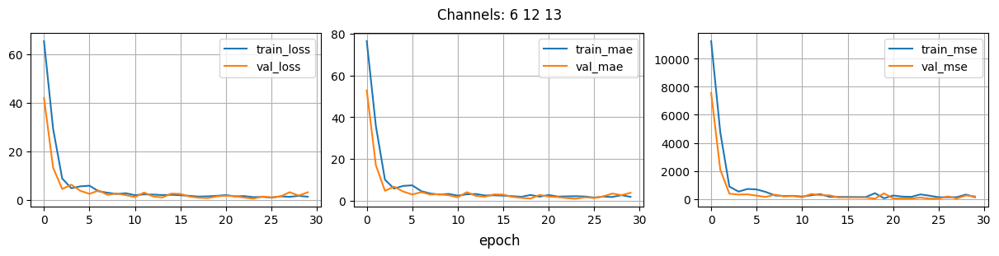

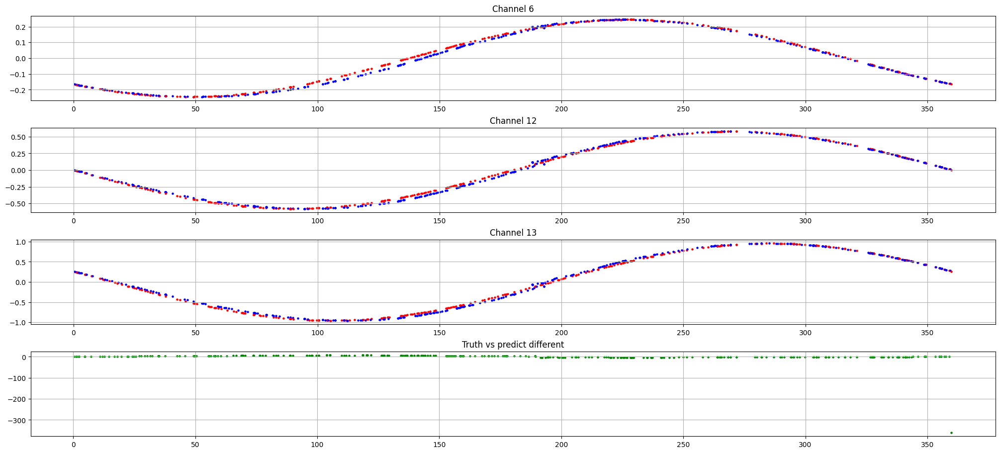

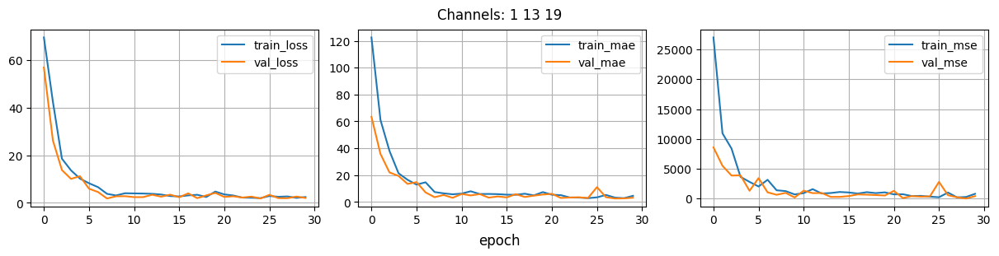

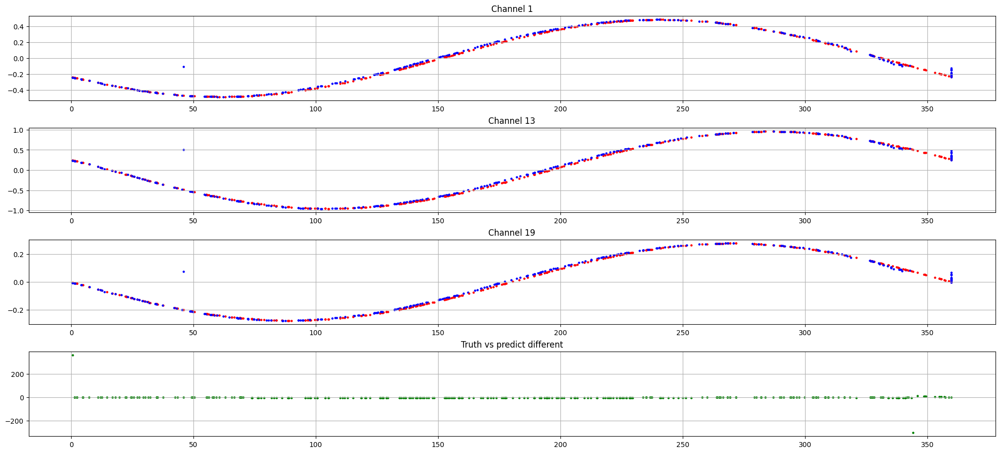

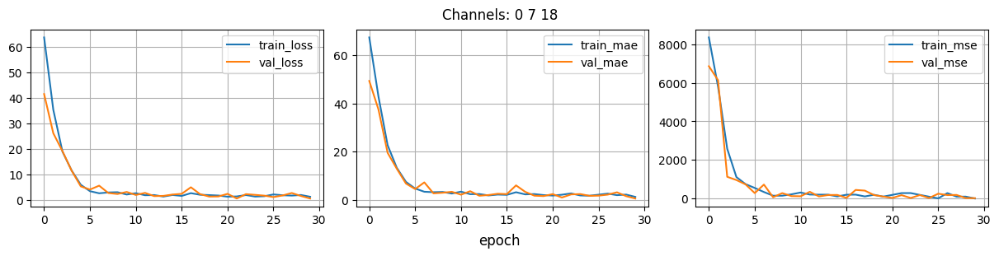

...

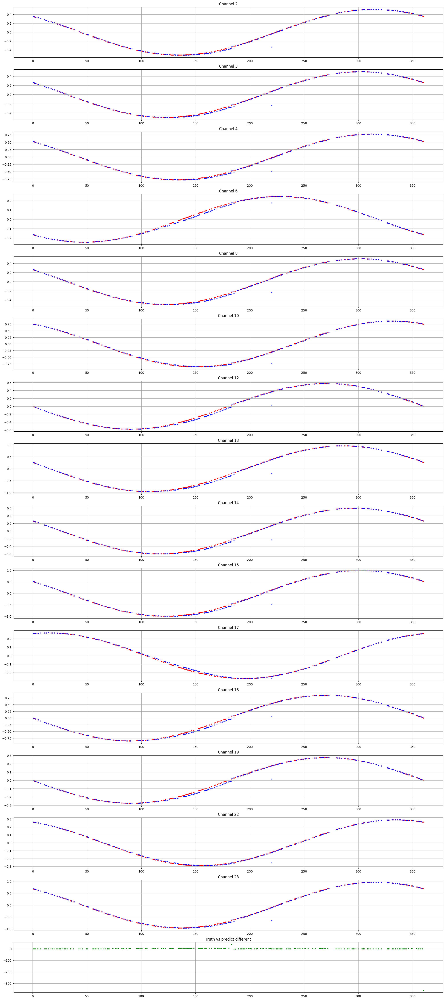

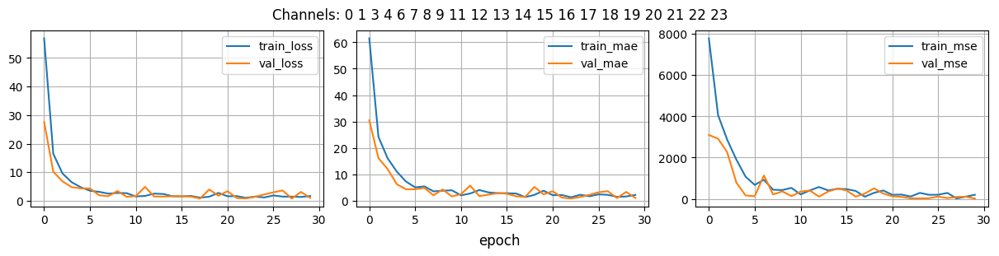

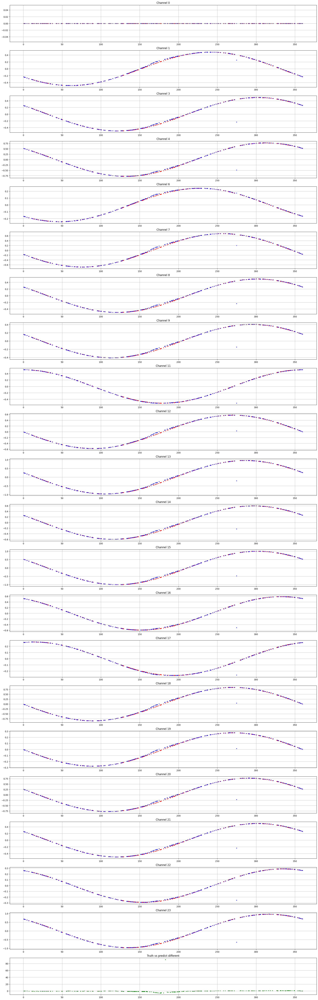

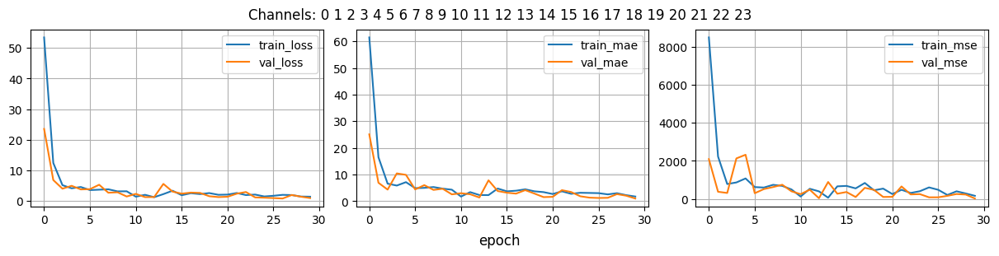

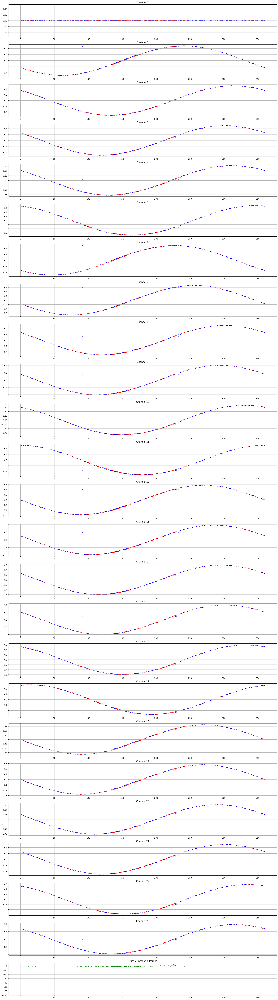

In [13]:
models, evaluates, losses = training_evaluation(top_list_channels, inputs, labels,\
                                                he_initializer=True, loss = 'selector',\
                                                floormod = True, epochs=30, plot=True)
evaluates

2025-03-31 21:03:54.277845: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
/tmp/ipykernel_2613525/128754474.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt .subplots(ncols = 3, nrows=1, figsize=(12,3), layout="constrained")


[[-3985682137612288.0, 1.6179370982467321e+31, 3985682137612288.0],
 [-3222930305581056.0, 1.0547160883126608e+31, 3222930305581056.0],
 [-3673183269945344.0, 1.3725966043809016e+31, 3673183269945344.0],
 [-2118501879775232.0, 4.593933528339791e+30, 2118501879775232.0],
 [-3377726295638016.0, 1.2148182449520128e+31, 3377726295638016.0],
 [-2617934501380096.0, 7.256544591239682e+30, 2617934501380096.0],
 [-2417205178269696.0, 6.361226822954194e+30, 2417205178269696.0],
 [-5870250167894016.0, 3.6604129183526975e+31, 5870250167894016.0],
 [-7876128207273984.0, 6.904005622634073e+31, 7876128207273984.0],
 [-7305610521477120.0, 5.8452428969254165e+31, 7305610521477120.0],
 [-5046889367994368.0, 2.8255981396688805e+31, 5046889367994368.0],
 [-8808871086784512.0, 8.808263503072515e+31, 8808871086784512.0],
 [-3106960551444480.0, 1.1425382626934016e+31, 3106960551444480.0],
 [-8631822334296064.0, 8.731654357453863e+31, 8631822334296064.0],
 [-1.9896431703752704e+16, 4.652329928433009e+32, 1.98

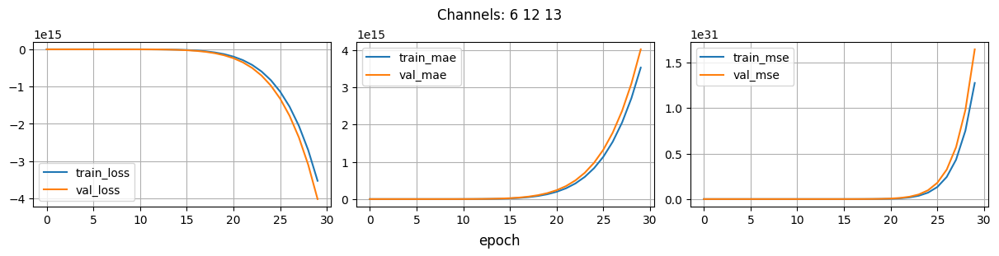

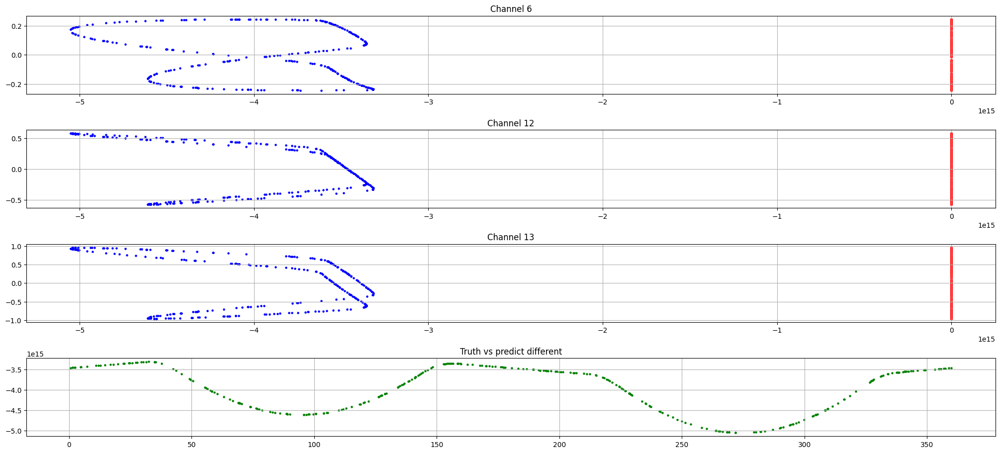

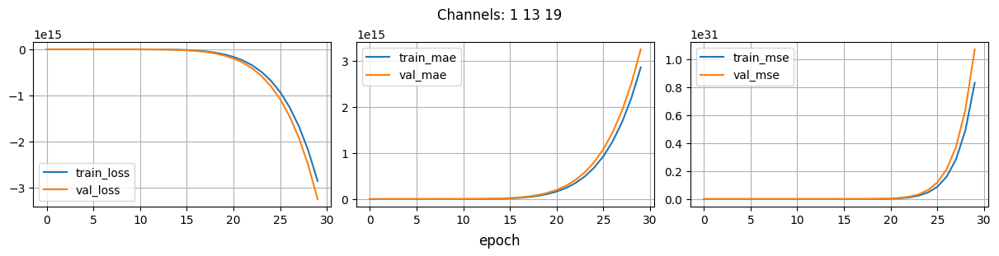

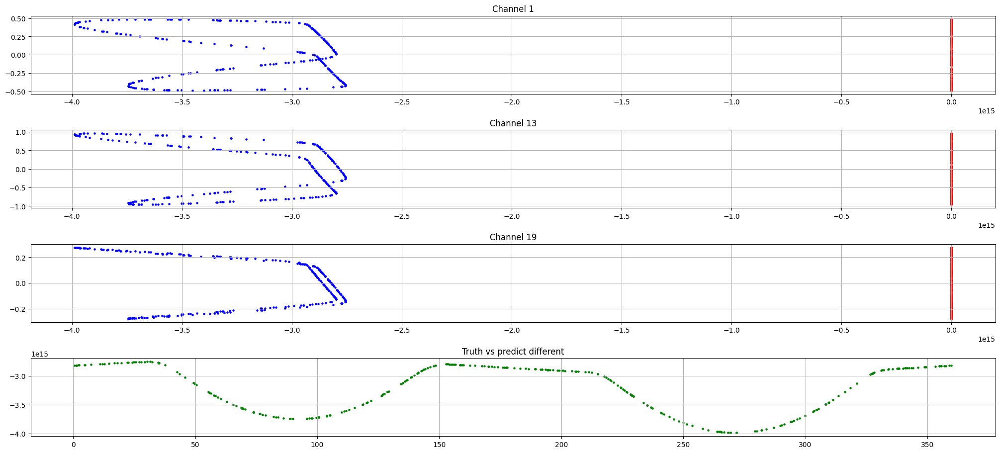

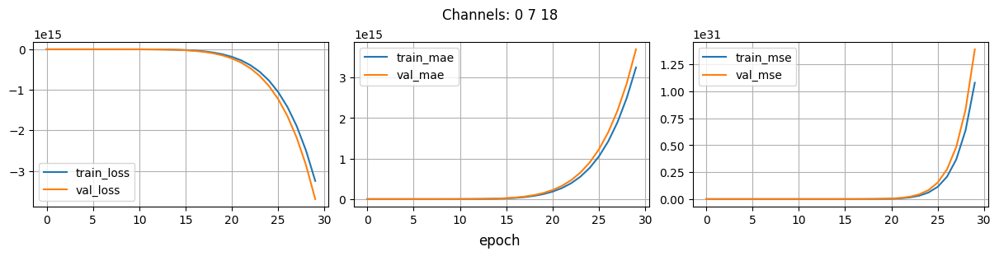

...

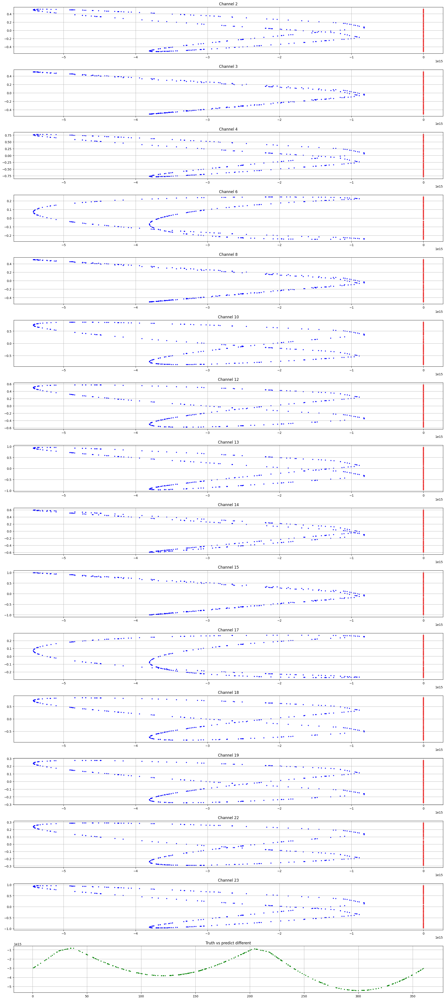

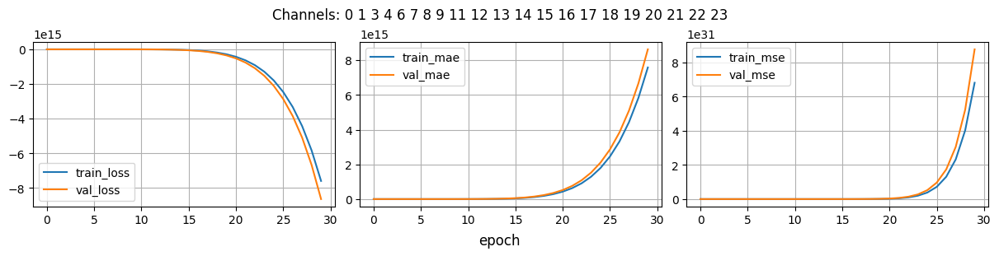

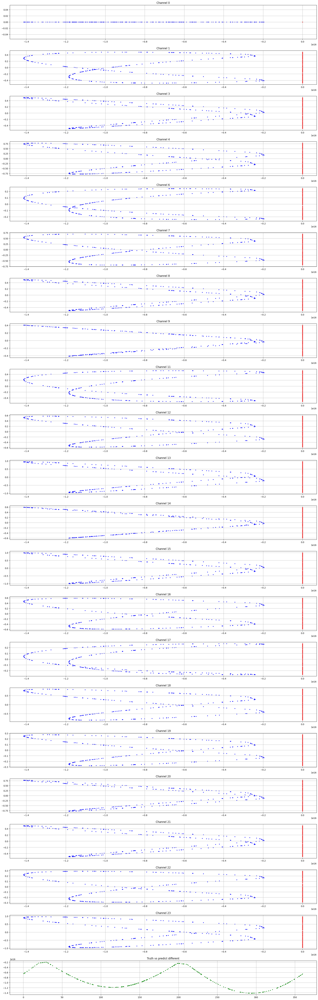

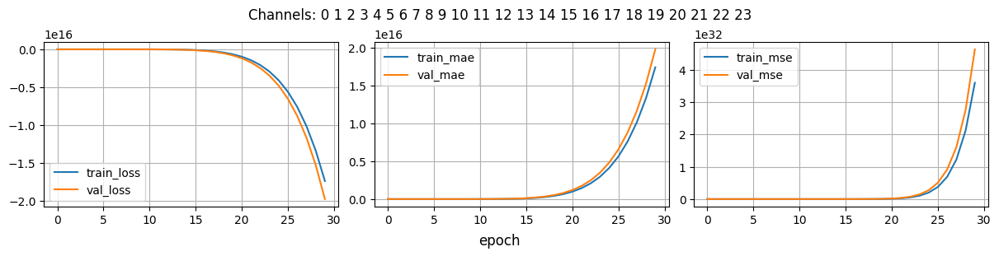

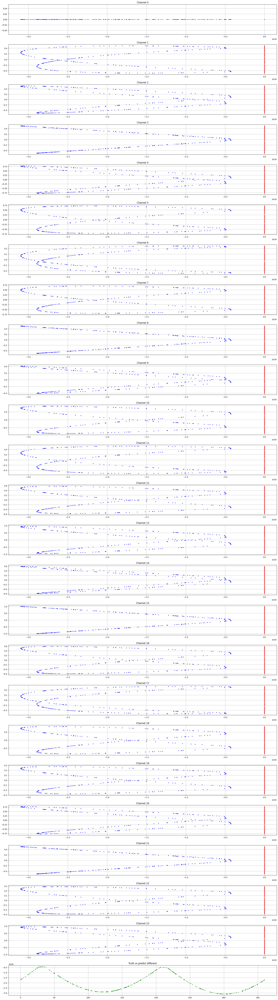

In [14]:
models, evaluates, losses = training_evaluation(top_list_channels, inputs, labels,\
                                                he_initializer=True, loss = 'selector',\
                                                floormod = False, epochs=30, plot=True)
evaluates